# Overfitting Simple Baseline Model

In [3]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

from tensorflow import keras
from keras.models import Model
import tensorflow as tf

import src.config as config
from src.dataloader import read_train, read_val
from src.preprocessing import CustomDataGenerator
from src.results import plot_history, plot_cm, class_report, save_params

OUTPUT_FOLDER = 'notebooks/experiments/extract_one_feature/output/'

LEARNING_RATE = 0.0005
BATCH_SIZE = 128
EPOCHS = 80

save_params(OUTPUT_FOLDER, lr=LEARNING_RATE, bs=BATCH_SIZE, ep=EPOCHS)

In [4]:
X_train, y_train = read_train()
print(X_train.shape, y_train.shape)

X_val, y_val = read_val()
print(X_val.shape, y_val.shape)

output_shape = len(config.LABELS)

layers = [
    keras.Input(shape=(config.IMG_SIZE, config.IMG_SIZE, config.N_CHANNELS)),
    keras.layers.Rescaling(1./255.),
    keras.layers.Conv2D(1,(3,3), activation = 'relu'),
    keras.layers.MaxPooling2D(pool_size = (4, 4)),

    keras.layers.Flatten(),
    keras.layers.Dense(64, activation='relu'),
    keras.layers.Dense(output_shape, activation='softmax')
]

model = keras.Sequential(layers)
'''
sparse_categorical_crossentropy para cuando las categorias vienen en una unica columna
categorical_crossentropy para cuando las categorias vienen en formato dummy
'''
model.compile(optimizer=keras.optimizers.legacy.Adam(learning_rate=LEARNING_RATE),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

model.summary()

(20300, 256, 256, 3) (20300,)
(1450, 256, 256, 3) (1450,)
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 256, 256, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 254, 254, 1)       28        
                                                                 
 max_pooling2d (MaxPooling2  (None, 63, 63, 1)         0         
 D)                                                              
                                                                 
 flatten (Flatten)           (None, 3969)              0         
                                                                 
 dense (Dense)               (None, 64)                254080    
                                                                 
 dense_1 (Dense)             (None, 29)                1885     

2023-10-29 19:25:09.608383: E tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:268] failed call to cuInit: CUDA_ERROR_UNKNOWN: unknown error
2023-10-29 19:25:09.608431: I tensorflow/compiler/xla/stream_executor/cuda/cuda_diagnostics.cc:168] retrieving CUDA diagnostic information for host: maquinon
2023-10-29 19:25:09.608433: I tensorflow/compiler/xla/stream_executor/cuda/cuda_diagnostics.cc:175] hostname: maquinon
2023-10-29 19:25:09.608601: I tensorflow/compiler/xla/stream_executor/cuda/cuda_diagnostics.cc:199] libcuda reported version is: 535.113.1
2023-10-29 19:25:09.608608: I tensorflow/compiler/xla/stream_executor/cuda/cuda_diagnostics.cc:203] kernel reported version is: 535.113.1
2023-10-29 19:25:09.608610: I tensorflow/compiler/xla/stream_executor/cuda/cuda_diagnostics.cc:309] kernel version seems to match DSO: 535.113.1


In [6]:
np.random.seed(0)

train_generator = CustomDataGenerator(X_train, y_train, batch_size=BATCH_SIZE)
model.fit(train_generator, epochs=EPOCHS, validation_data=(X_val, y_val))
model.save(OUTPUT_FOLDER+f'model.h5')

Epoch 1/80


159/159 [==============================] - 5s 33ms/step - loss: 3.0324 - accuracy: 0.1427 - val_loss: 2.8363 - val_accuracy: 0.2297
Epoch 2/80
159/159 [==============================] - 5s 32ms/step - loss: 2.6674 - accuracy: 0.2513 - val_loss: 2.6307 - val_accuracy: 0.2559
Epoch 3/80
159/159 [==============================] - 5s 32ms/step - loss: 2.4887 - accuracy: 0.2948 - val_loss: 2.5330 - val_accuracy: 0.2848
Epoch 4/80
159/159 [==============================] - 5s 32ms/step - loss: 2.3566 - accuracy: 0.3343 - val_loss: 2.4278 - val_accuracy: 0.3131
Epoch 5/80
159/159 [==============================] - 5s 32ms/step - loss: 2.2428 - accuracy: 0.3641 - val_loss: 2.3968 - val_accuracy: 0.3207
Epoch 6/80
159/159 [==============================] - 5s 32ms/step - loss: 2.1495 - accuracy: 0.3911 - val_loss: 2.3694 - val_accuracy: 0.3331
Epoch 7/80
159/159 [==============================] - 5s 32ms/step - loss: 2.0606 - accuracy: 0.4162 - val_loss: 2.3360 - val_accuracy: 0.3324
Epoch 8/80

KeyboardInterrupt: 

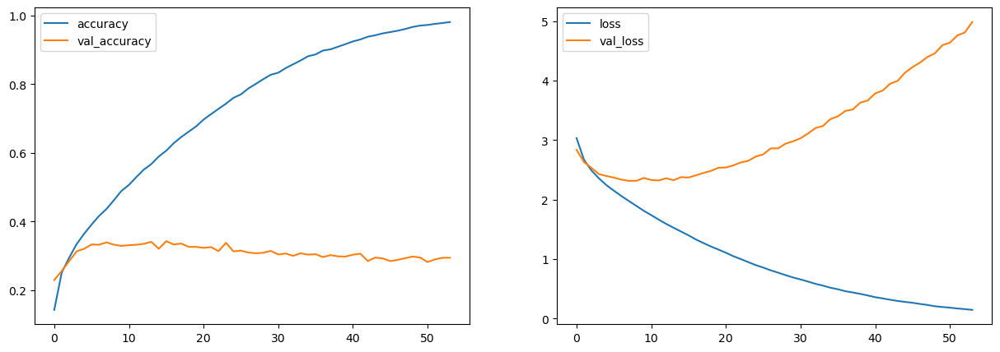

In [14]:
fig = plot_history(model)
fig.savefig(OUTPUT_FOLDER+f'history_lr_{LEARNING_RATE}_bs_{BATCH_SIZE}_ep_{EPOCHS}.png')

/home/alberto/anaconda3/envs/tensorflow/lib/python3.11/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


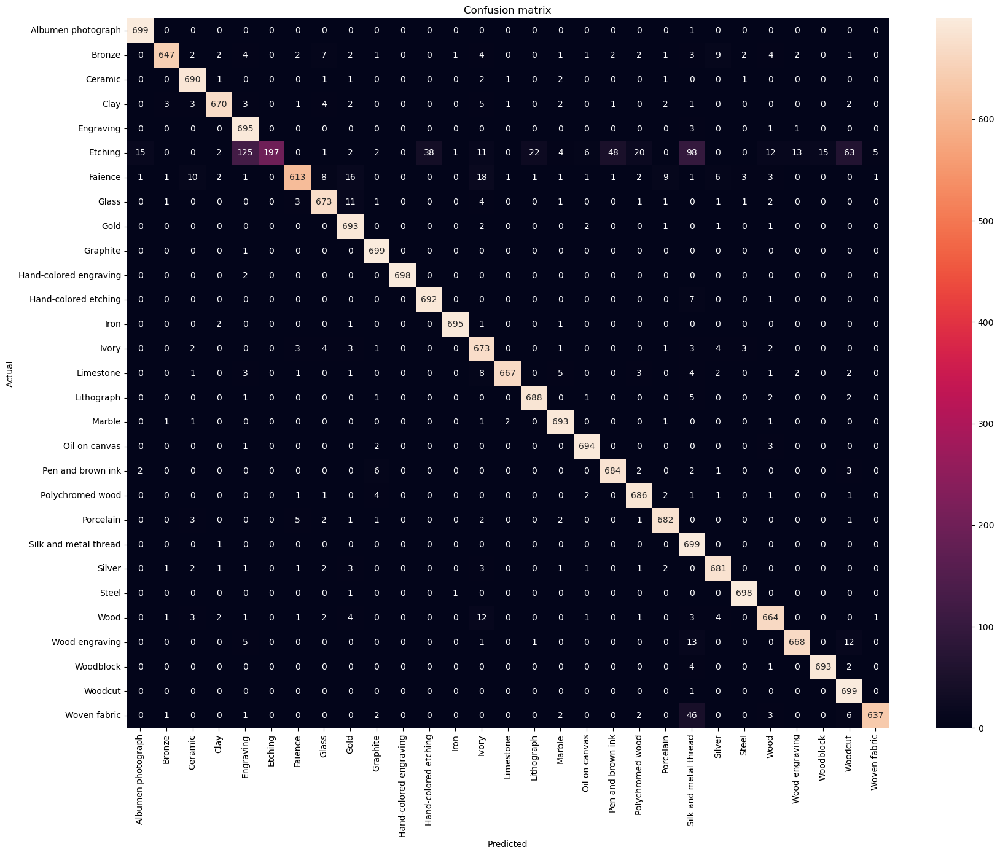

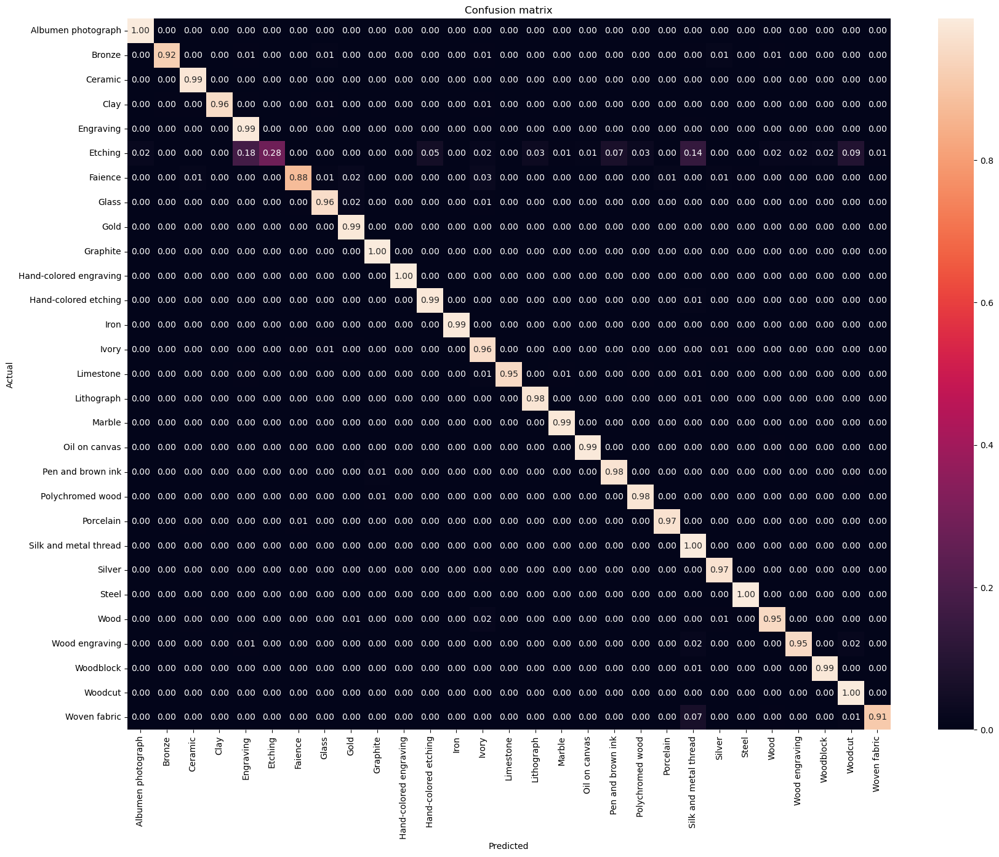

                        precision    recall  f1-score   support

    Albumen photograph       0.97      1.00      0.99       700
                Bronze       0.99      0.92      0.95       700
               Ceramic       0.96      0.99      0.97       700
                  Clay       0.98      0.96      0.97       700
             Engraving       0.82      0.99      0.90       700
               Etching       1.00      0.28      0.44       700
               Faience       0.97      0.88      0.92       700
                 Glass       0.95      0.96      0.96       700
                  Gold       0.94      0.99      0.96       700
              Graphite       0.97      1.00      0.98       700
Hand-colored engraving       1.00      1.00      1.00       700
  Hand-colored etching       0.95      0.99      0.97       700
                  Iron       1.00      0.99      0.99       700
                 Ivory       0.90      0.96      0.93       700
             Limestone       0.99      

In [15]:
model.save(OUTPUT_FOLDER+'model.h5')
model = keras.models.load_model(OUTPUT_FOLDER+'model.h5')

y_prob = model.predict(X_train, verbose=0)
y_pred = np.argmax(y_prob, axis=1)

fig = plot_cm(y_train, y_pred, labels=config.LABELS)
fig.savefig(OUTPUT_FOLDER+'confusion_matrix.jpg')

fig = plot_cm(y_train, y_pred, labels=config.LABELS, pct=True)
fig.savefig(OUTPUT_FOLDER+'confusion_matrix_pct.jpg')

report = class_report(y_train, y_pred, out_path=OUTPUT_FOLDER)

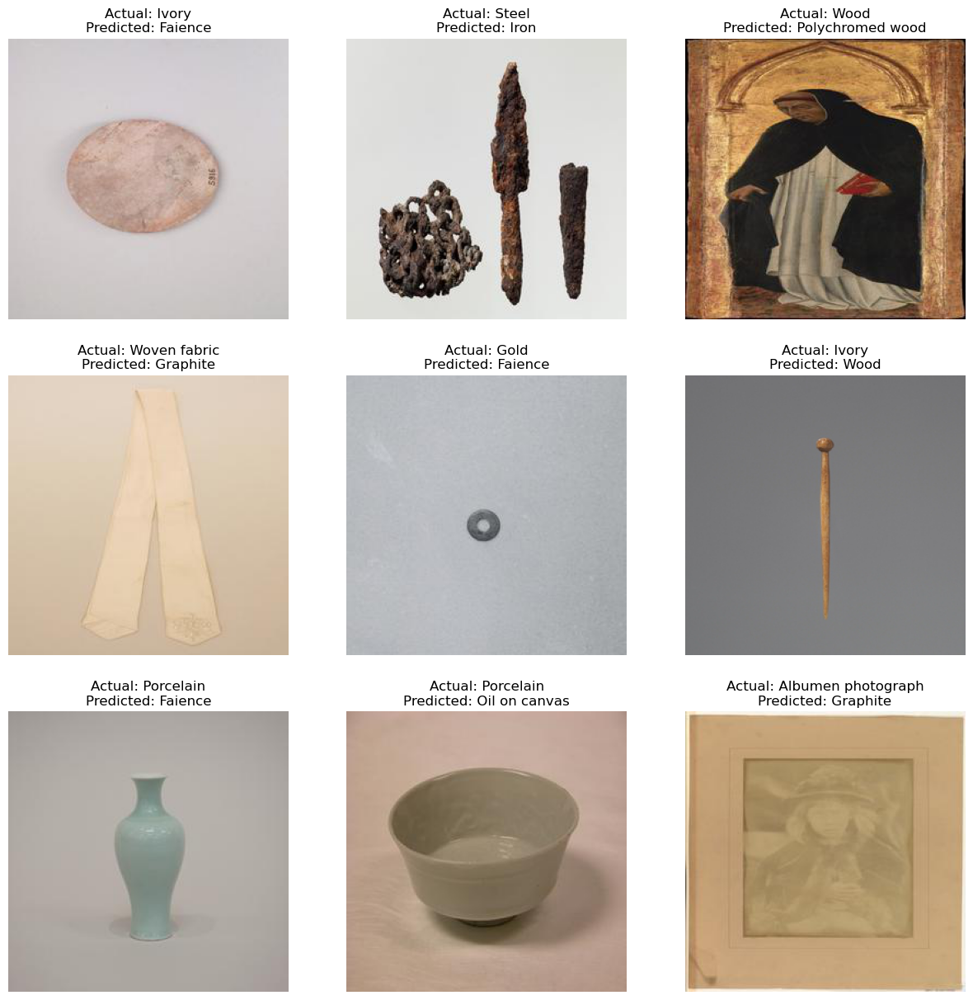

In [17]:
# Get the indices of wrong predictions
wrong_idx = np.where(y_train != y_pred)[0]

# Plot some of the wrong predictions
fig, ax = plt.subplots(3,3, figsize=(15,15))
for i, idx in enumerate(wrong_idx[:9]):
    img = X_train[idx]
    ax[i//3, i%3].imshow(img)
    ax[i//3, i%3].set_title(f'Actual: {labels[y_train[idx]]}\nPredicted: {labels[y_pred[idx]]}')
    ax[i//3, i%3].axis('off')
plt.show()


1/1 [==============================] - 0s 31ms/step


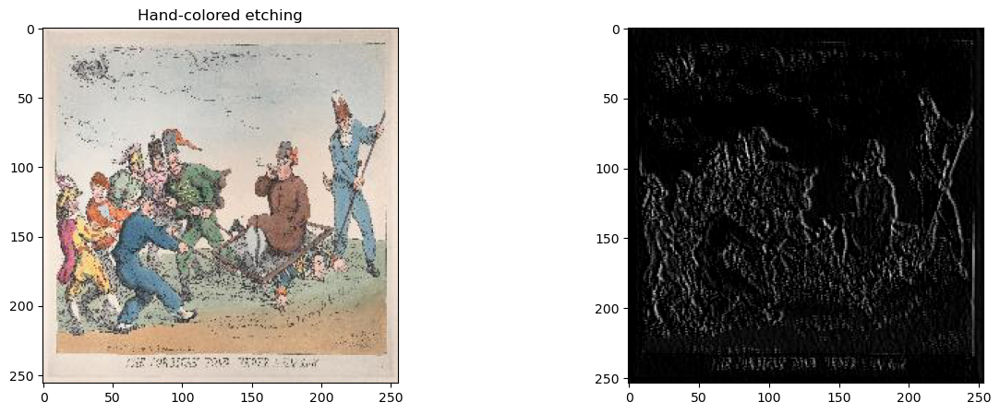

In [11]:
# Import model from kerasa
from keras.models import Model

k = 300
fig, ax = plt.subplots(1,2, figsize=(15,5))
ax[0].imshow(X_train[k, :, :])
ax[0].set_title(labels[y_train[k]])

Image_Tensor = X_train[k, :, :].astype(float)
Image_Tensor = tf.expand_dims(Image_Tensor, axis = 0)
# Image_Tensor = Image_Tensor/255.0

# Extract the Model Outputs for all the Layers
Model_Outputs = [layer.output for layer in model.layers]
# Create a Model with Model Input as Input and the Model Outputs as Output
Activation_Model = Model(model.input, Model_Outputs)
Activations = Activation_Model.predict(Image_Tensor)

ax[1].imshow(Activations[1][0, :, :, :], cmap='gray')

In [34]:
"Steel" in labels

True

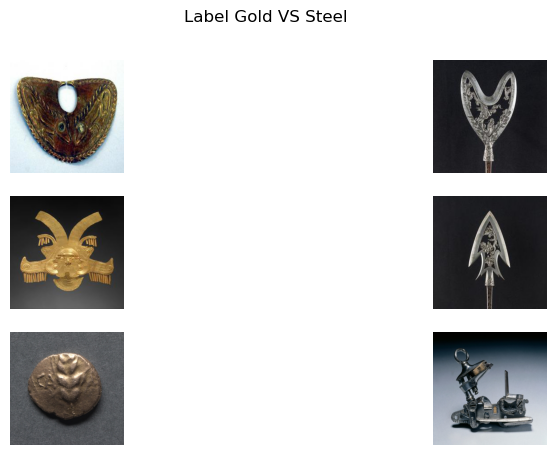

In [55]:
def plot_compare_classes(X, y, cat_name1, cat_name2, labels, n_plots=3):
    
    cat_idx1 = labels.index(cat_name1)
    cat_idx2 = labels.index(cat_name2)

    X_1, X_2 = X[y == cat_idx1], X[y == cat_idx2]
    rnd_idx = np.random.randint(0, min(X_1.shape[0], X_2.shape[0]), n_plots)
    fig, ax = plt.subplots(n_plots, 2, figsize=(10, 5))

    for i, idx in enumerate(rnd_idx):
        ax[i, 0].imshow(X_1[idx])
        ax[i, 0].axis('off')

        ax[i, 1].imshow(X_2[idx])
        ax[i, 1].axis('off')

    fig.suptitle(f"Label {cat_name1} VS {cat_name2}")
    plt.show()

plot_compare_classes(X_train, y_train, "Gold", "Steel", labels=labels)

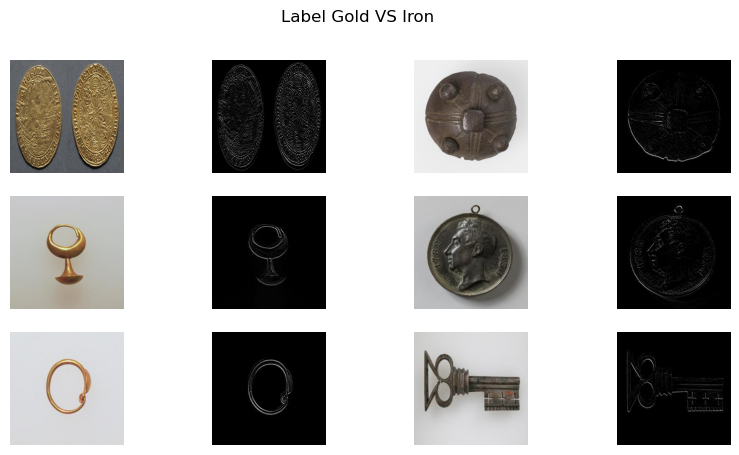

In [21]:
def get_layer_activations(Image_Tensor, model):
    Image_Tensor = tf.expand_dims(Image_Tensor, axis = 0)

    # Extract the Model Outputs for all the Layers
    Model_Outputs = [layer.output for layer in model.layers]
    # Create a Model with Model Input as Input and the Model Outputs as Output
    Activation_Model = Model(model.input, Model_Outputs)
    Activations = Activation_Model.predict(Image_Tensor, verbose=0)
    return Activations

def plot_compare_activations(X, y, cat_name1, cat_name2, labels, model, n_plots=3):
    
    cat_idx1 = labels.index(cat_name1)
    cat_idx2 = labels.index(cat_name2)

    X_1, X_2 = X[y == cat_idx1], X[y == cat_idx2]
    rnd_idx = np.random.randint(0, min(X_1.shape[0], X_2.shape[0]), n_plots)
    
    fig, ax = plt.subplots(n_plots, 4, figsize=(10, 5))
    for i, idx in enumerate(rnd_idx):
        ax[i, 0].imshow(X_1[idx])
        ax[i, 0].axis('off')

        act_1 = get_layer_activations(X_1[idx], model)[1][0, :, :, :]
        ax[i, 1].imshow(act_1, cmap='gray')
        ax[i, 1].axis('off')

        ax[i, 2].imshow(X_2[idx])
        ax[i, 2].axis('off')

        act_2 = get_layer_activations(X_2[idx], model)[1][0, :, :, :]
        ax[i, 3].imshow(act_2, cmap='gray')
        ax[i, 3].axis('off')

    fig.suptitle(f"Label {cat_name1} VS {cat_name2}")
    plt.show()

plot_compare_activations(X_train, y_train, "Gold", "Iron", model=model, labels=labels)

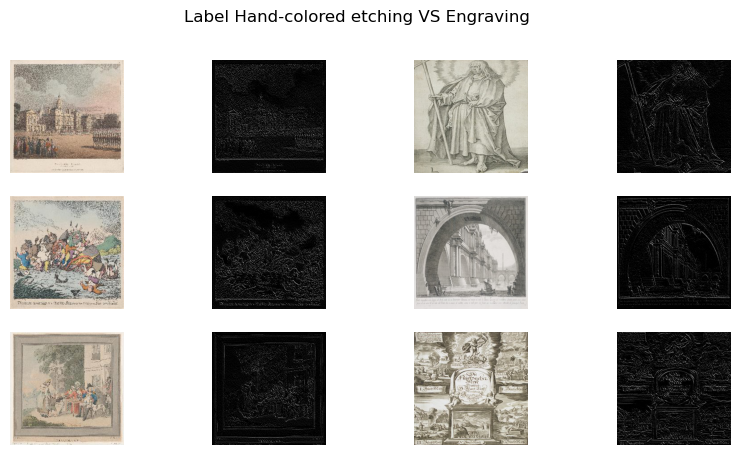

In [22]:
plot_compare_activations(X_train, y_train, "Hand-colored etching", "Engraving", model=model, labels=labels)

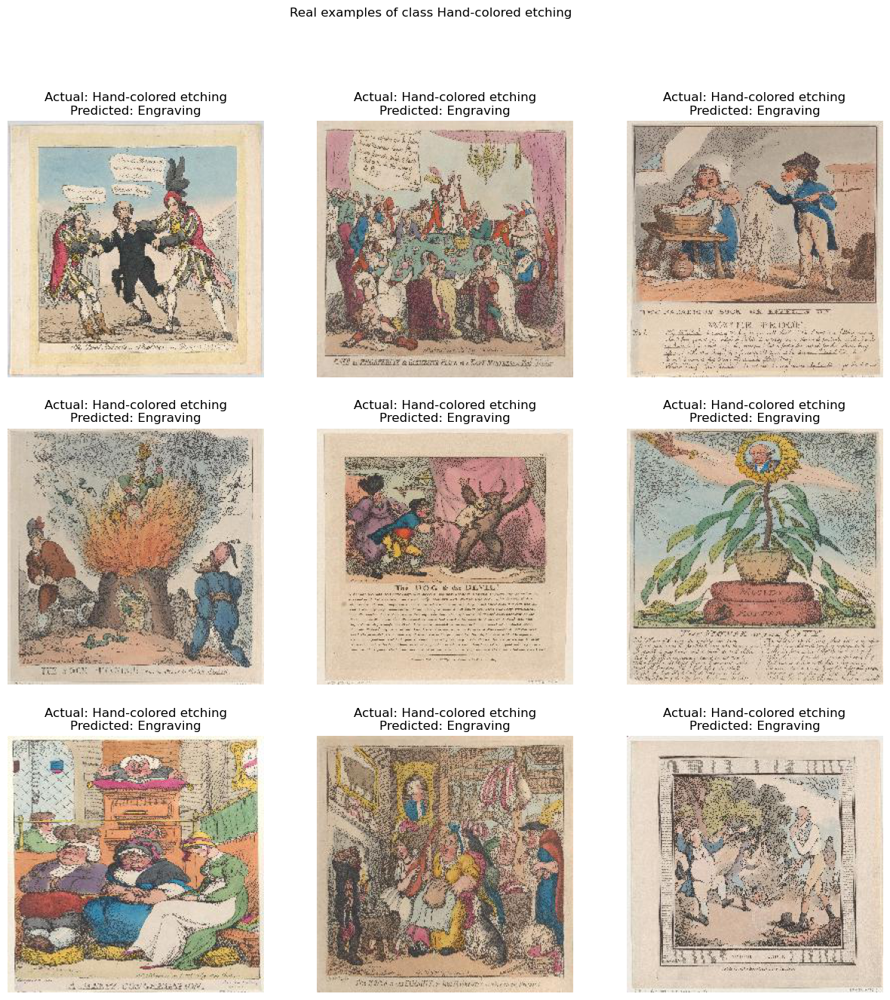

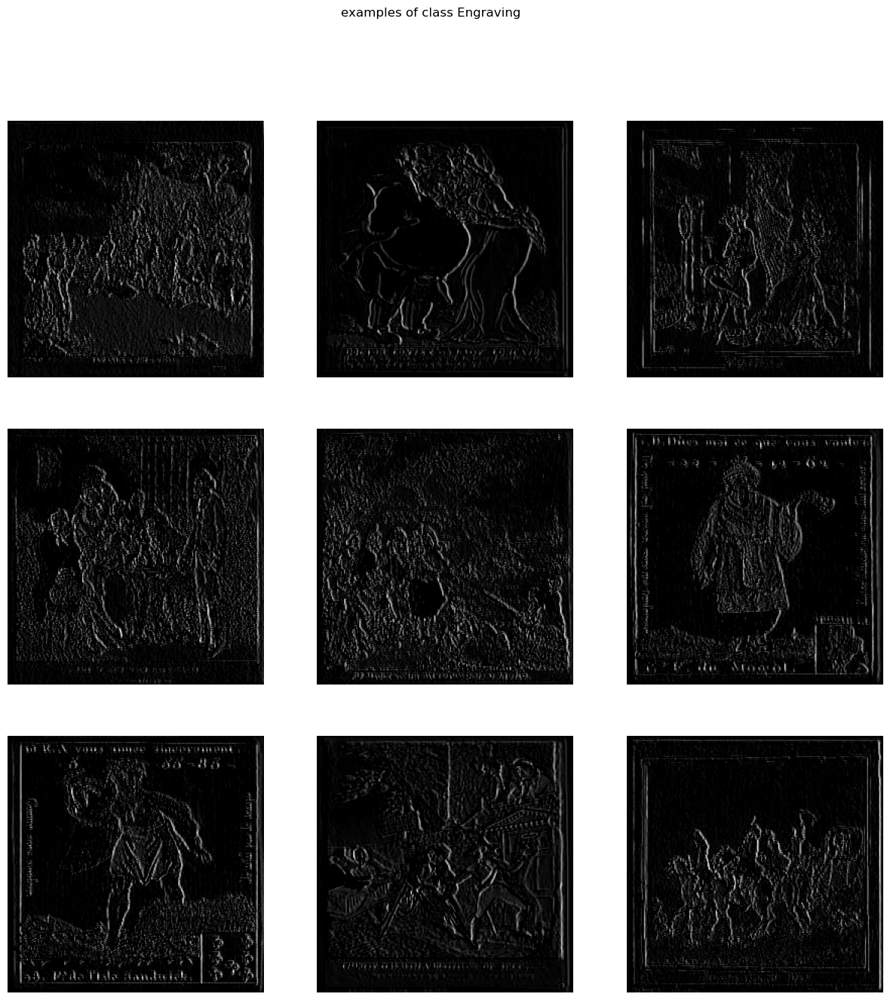

Text(0.5, 0.98, 'examples of class 4')

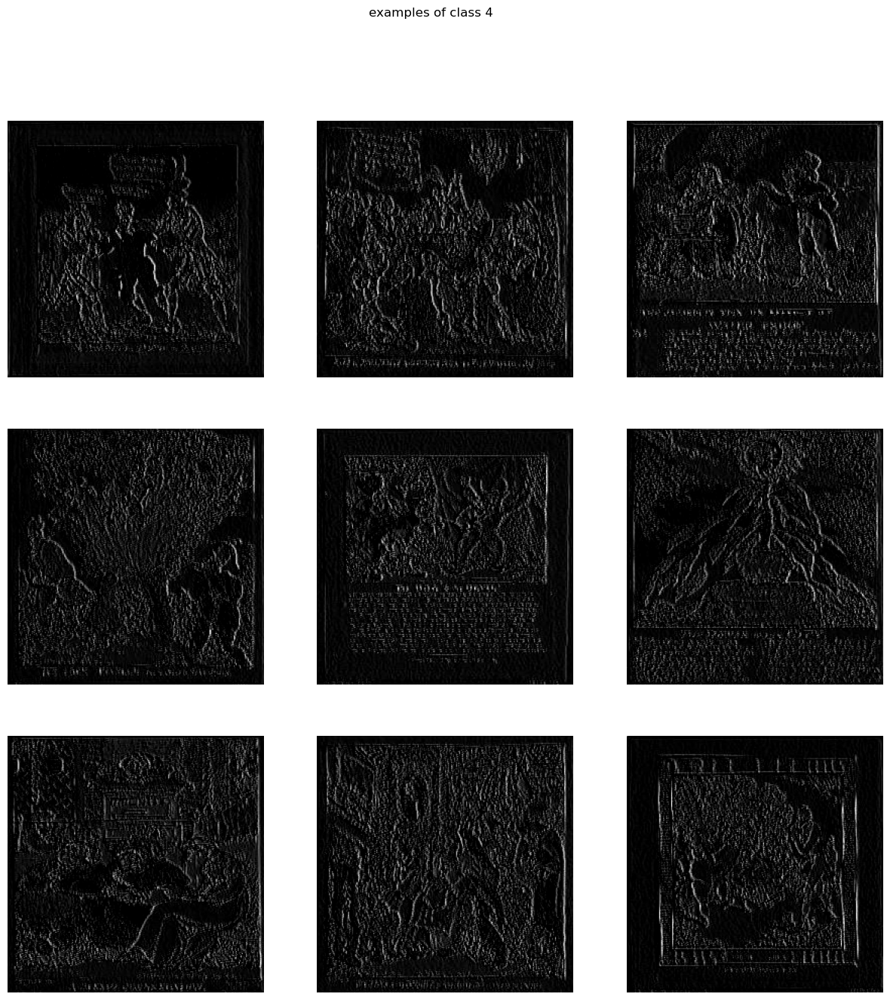

In [26]:
def get_layer_activations(Image_Tensor, model):
    Image_Tensor = tf.expand_dims(Image_Tensor, axis = 0)

    # Extract the Model Outputs for all the Layers
    Model_Outputs = [layer.output for layer in model.layers]
    # Create a Model with Model Input as Input and the Model Outputs as Output
    Activation_Model = Model(model.input, Model_Outputs)
    Activations = Activation_Model.predict(Image_Tensor, verbose=0)
    return Activations

cat_pred_name = 'Engraving'
cat_real_name = 'Hand-colored etching'

cat_pred = labels.index(cat_pred_name)
cat_real = labels.index(cat_real_name)
X_wrong = X_train[(y_train == cat_real)&(y_pred == cat_pred)]    


# Print examples of the misclassified
fig, ax = plt.subplots(3,3, figsize=(15,15))
for i, img in enumerate(X_wrong[:9]):
    ax[i//3, i%3].imshow(img)
    ax[i//3, i%3].set_title(f'Actual: {labels[cat_real]}\nPredicted: {labels[cat_pred]}')
    ax[i//3, i%3].axis('off')
fig.suptitle(f"Real examples of class {cat_real_name}")
plt.show()

# Show the activations of the real class
X_real = X_train[y_train == cat_real]

fig, ax = plt.subplots(3,3, figsize=(15,15))
for i, img in enumerate(X_real[:9]):
    act = get_layer_activations(img, model)[1][0, :, :, :];
    ax[i//3, i%3].imshow(act, cmap="gray")
    ax[i//3, i%3].axis('off')
fig.suptitle(f"examples of class {cat_pred_name}")
plt.show()

# SHow the activations of the class supposed by the model

fig, ax = plt.subplots(3,3, figsize=(15,15))
for i, img in enumerate(X_wrong[:9]):
    act = get_layer_activations(img, model)[1][0, :, :, :];
    ax[i//3, i%3].imshow(act, cmap='gray')
    ax[i//3, i%3].axis('off')

fig.suptitle(f"examples of class {cat_pred}")

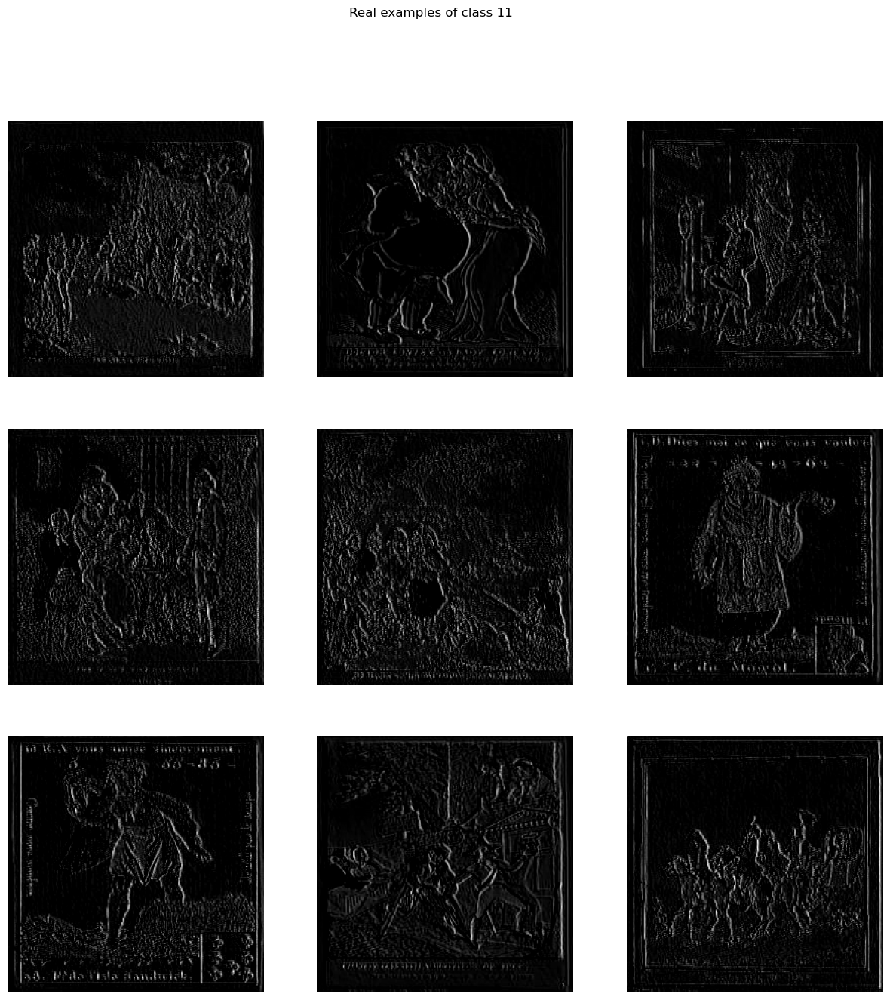

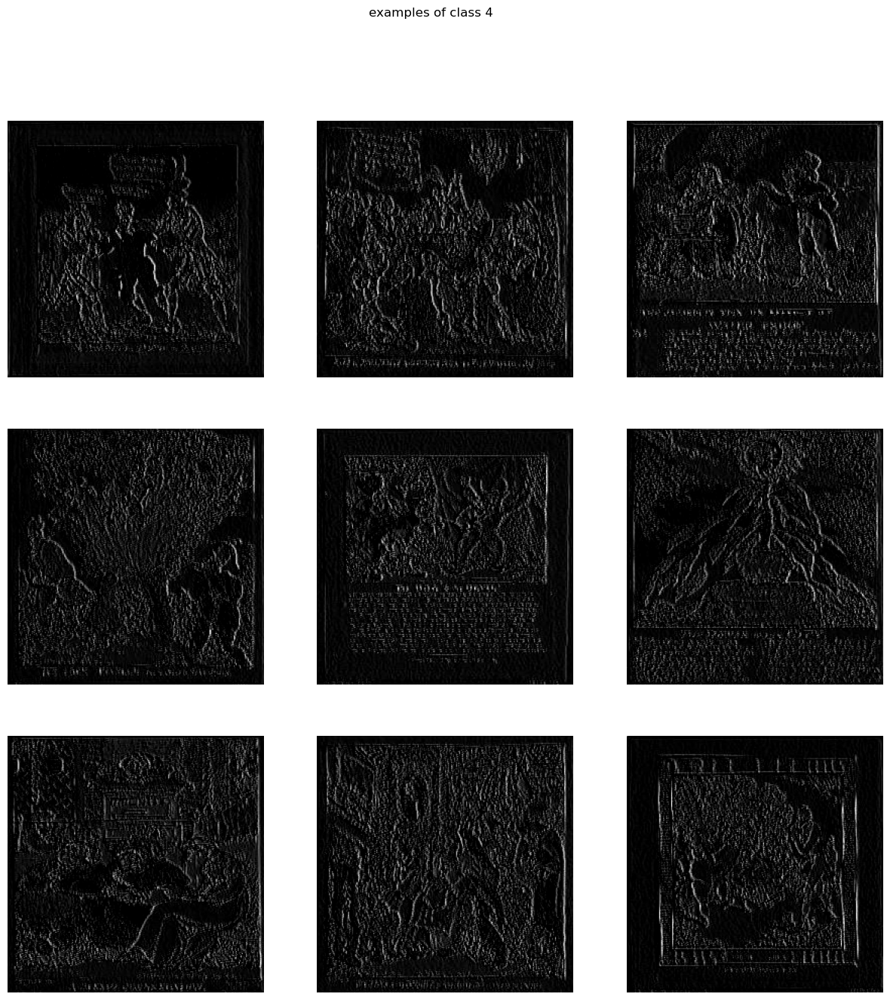

In [23]:
def get_layer_activations(Image_Tensor, model):
    Image_Tensor = tf.expand_dims(Image_Tensor, axis = 0)

    # Extract the Model Outputs for all the Layers
    Model_Outputs = [layer.output for layer in model.layers]
    # Create a Model with Model Input as Input and the Model Outputs as Output
    Activation_Model = Model(model.input, Model_Outputs)
    Activations = Activation_Model.predict(Image_Tensor, verbose=0)
    return Activations

X_ivory = X_train[y_train == cat_real]

fig, ax = plt.subplots(3,3, figsize=(15,15))
for i, img in enumerate(X_ivory[:9]):
    act = get_layer_activations(img, model)[1][0, :, :, :];
    ax[i//3, i%3].imshow(act, cmap="gray")
    ax[i//3, i%3].axis('off')
fig.suptitle(f"Real examples of class {cat_real}")
plt.show()

fig, ax = plt.subplots(3,3, figsize=(15,15))
for i, img in enumerate(X_wrong[:9]):
    act = get_layer_activations(img, model)[1][0, :, :, :];
    ax[i//3, i%3].imshow(act, cmap='gray')
    ax[i//3, i%3].axis('off')

fig.suptitle(f"examples of class {cat_pred}")
plt.show()

1/1 [==============================] - 0s 30ms/step


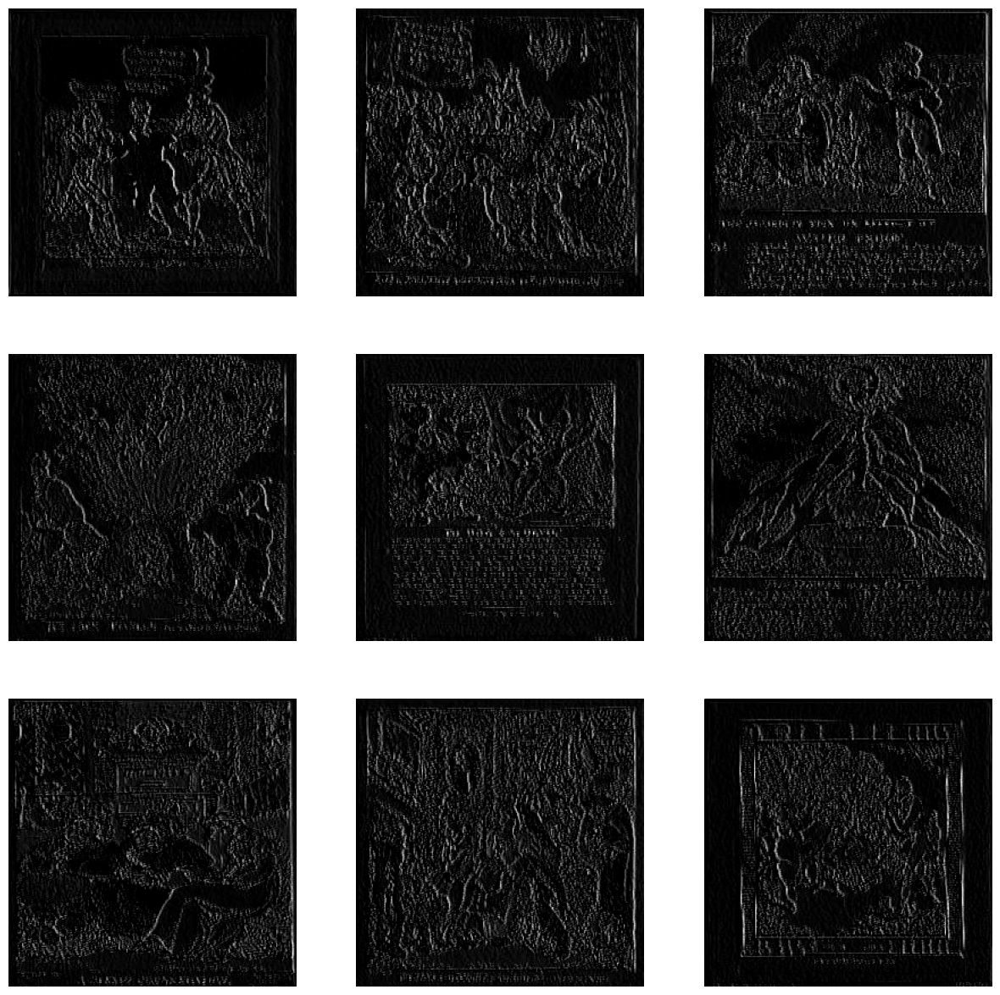

In [19]:
fig, ax = plt.subplots(3,3, figsize=(15,15))
for i, img in enumerate(X_wrong[:9]):
    act = get_layer_activations(img, model)[1][0, :, :, :];
    ax[i//3, i%3].imshow(act, cmap='gray')
    ax[i//3, i%3].axis('off')